## Disease Condition prediction based on drug reviews

In this project, we will classify the condition of patients using the reviews of the drugs given by patients using drug reviews dataset available in [UCI ML Repository](https://archive.ics.uci.edu/ml/datasets/Drug+Review+Dataset+%28Drugs.com%29).

## Importing libraries

In [2]:
import pandas as pd # data preprocessing
import itertools # confusion matrix
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

In [4]:
!pip install BeautifulSoup4 

In [11]:
str1="I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations."


lst = [str1]
lst

['I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.']

In [3]:
import nltk
import sklearn
import bs4
print('The nltk version is {}.'.format(nltk.__version__))
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print('The scikit-learn version is {}.'.format(bs4.__version__))

The nltk version is 3.8.1.
The scikit-learn version is 1.4.1.post1.
The scikit-learn version is 4.12.3.


In [4]:
df=pd.read_csv('data/drugsComTrain_raw.csv')

In [5]:
df.head()

,uniqueID,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9,20-May-12,27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8,27-Apr-10,192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5,14-Dec-09,17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8,3-Nov-15,10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9,27-Nov-16,37


In [7]:
df.condition.value_counts().head()

condition
Birth Control    28788
Depression        9069
Pain              6145
Anxiety           5904
Acne              5588
Name: count, dtype: int64

In [8]:
conditions = [
    'Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Bipolar Disorder', 'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Diabetes, Type 2', 'Emergency Contraception', 'High Blood Pressure',
    'Vaginal Yeast Infection', 'Abnormal Uterine Bleeding',
    'Bowel Preparation', 'Fibromyalgia', 'Smoking Cessation', 'Migraine',
    'Anxiety and Stress'
]

df_train = df[df['condition'].isin(conditions)]


In [9]:
df.shape

(161297, 7)

In [10]:
df_train.shape

(88431, 7)

In [12]:
X = df_train.drop(['uniqueID','drugName','rating','date','usefulCount'],axis=1)

## EDA

In [1]:
X.condition.value_counts().head()

NameError: name 'X' is not defined

In [14]:
X.head()

,condition,review
1,ADHD,"""My son is halfway through his fourth week of ..."
2,Birth Control,"""I used to take another oral contraceptive, wh..."
3,Birth Control,"""This is my first time using any form of birth..."
6,Emergency Contraception,"""He pulled out, but he cummed a bit in me. I t..."
9,Birth Control,"""I had been on the pill for many years. When m..."


In [18]:
# segregating dataframe for analyzing individual condition
X_birth=X[(X['condition']=='Birth Control')]
X_dep=X[(X['condition']=='Depression')]
X_pain=X[(X['condition']=='Pain')]
X_anxiety=X[(X['condition']=='Anxiety')]
X_acne=X[(X['condition']=='Acne')]
X_inso=X[(X['condition']=='Insomnia')]
X_wl=X[(X['condition']=='Weight Loss')]
X_obe=X[(X['condition']=='Obesity')]
X_adhd=X[(X['condition']=='ADHD')]
X_ec=X[(X['condition']=='Emergency Contraception')]
X_vyc=X[(X['condition']=='Vaginal Yeast Infection')]
X_sc=X[(X['condition']=='Smoking Cessation')]
X_mig=X[(X['condition']=='Migraine')]
X_bp=X[(X['condition']=='High Blood Pressure')]
X_diab=X[(X['condition']=='Diabetes, Type 2')]
X_aas=X[(X['condition']=='Anxiety and Stress')]

Text(0.5, 1.0, 'Word cloud for Birth control')

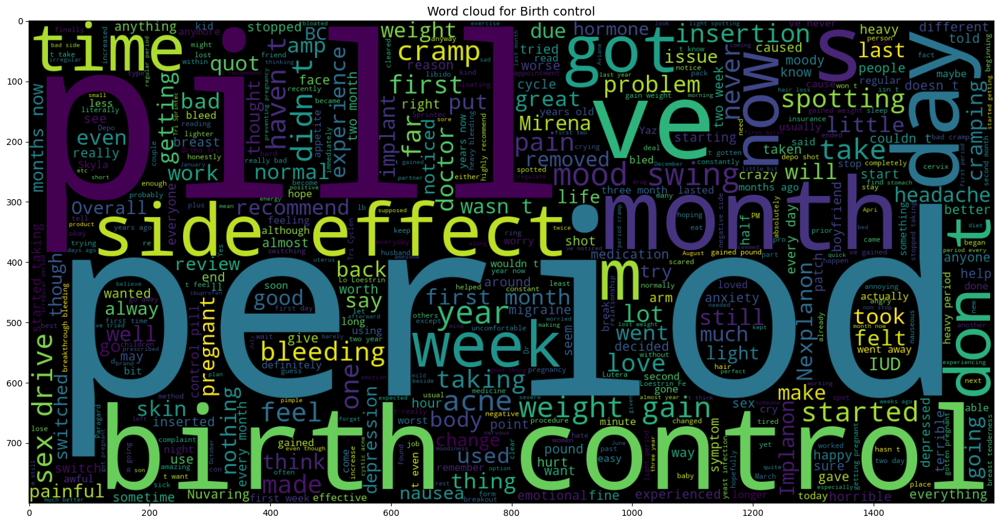

In [19]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_birth.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

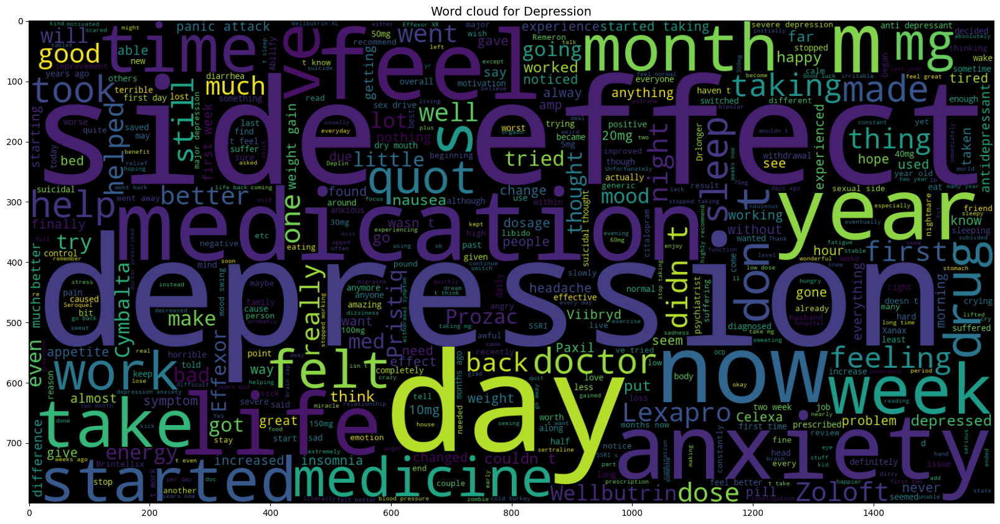

In [20]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

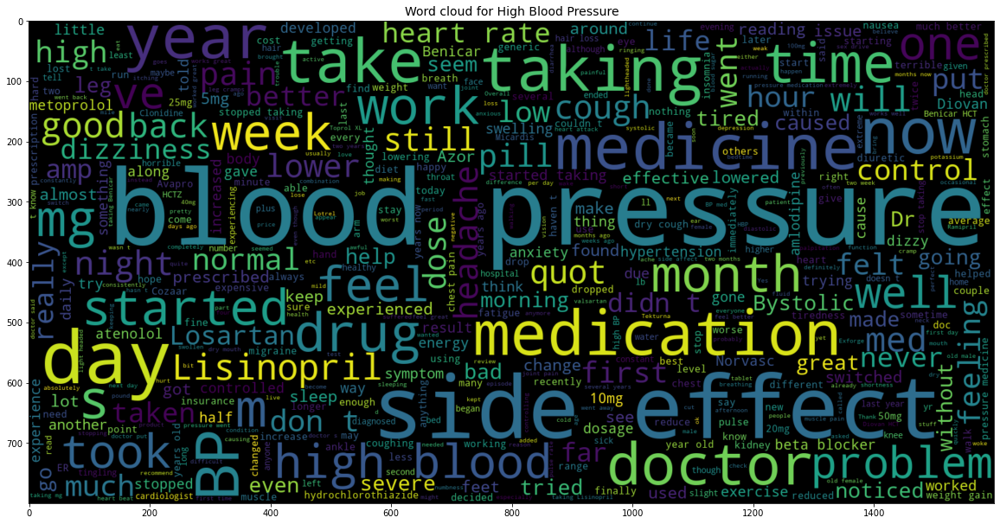

In [130]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes Type 2')

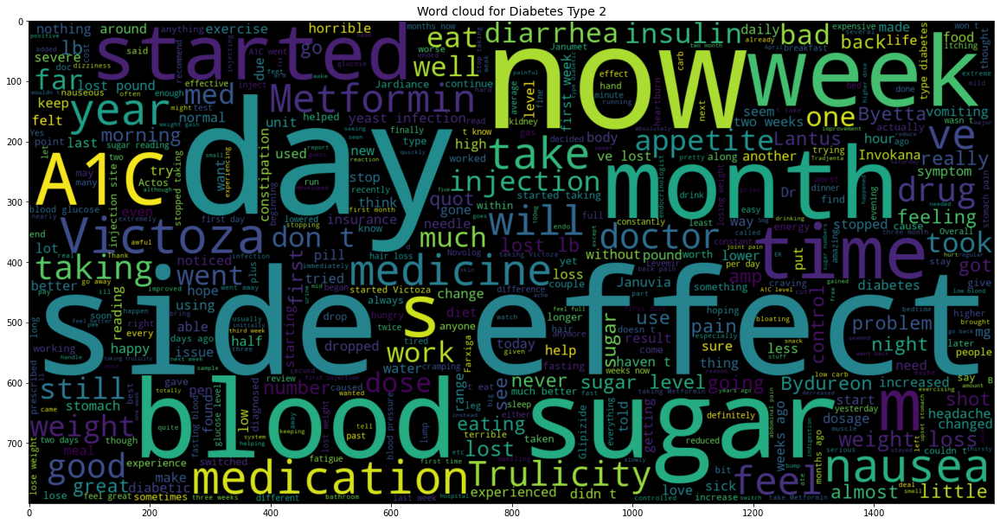

In [131]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_diab.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes Type 2',fontsize=14)

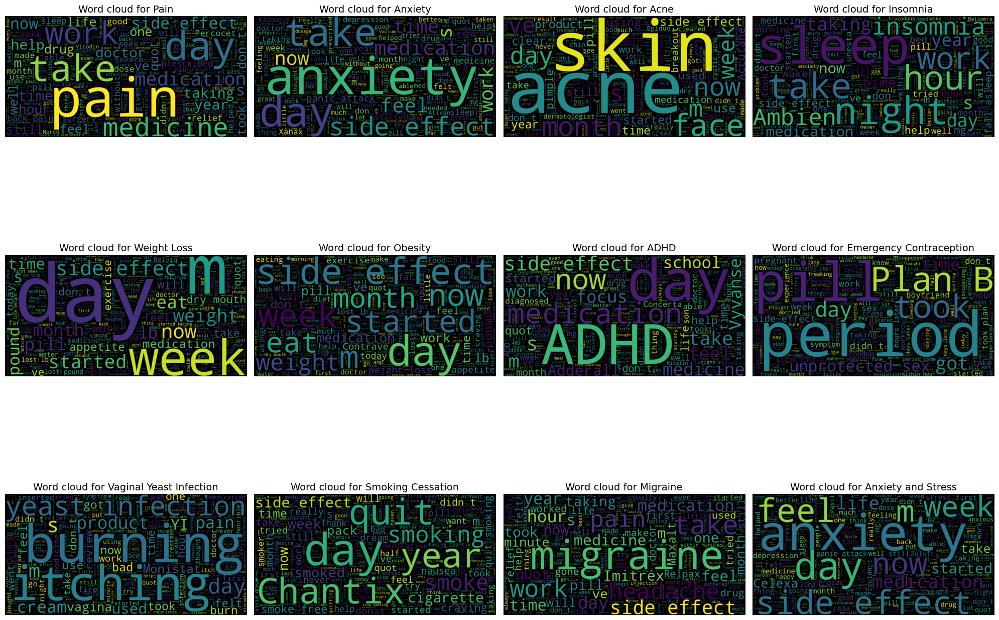

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# List of conditions
conditions = [
     'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'Anxiety and Stress'
]

# Define figure size for the entire plot
plt.figure(figsize=(20, 20))

# Loop over each condition
for i, condition in enumerate(conditions, 1):
    # Filter data for the current condition
    X_condition = X[X['condition'] == condition]
    
    # Generate word cloud for the reviews of the current condition
    wc = WordCloud(max_words=500, width=800, height=400).generate(" ".join(X_condition.review))
    
    # Create subplot for the current condition
    plt.subplot(4, 4, i)
    
    # Display word cloud
    plt.imshow(wc, interpolation='bilinear')
    plt.title('Word cloud for ' + condition, fontsize=14)
    plt.axis('off')  # Turn off axis
    
plt.tight_layout()
plt.show()


## data preprocessing

In [22]:
X['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [24]:
X['review'][1]

'"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective."'

In [25]:
for i, col in enumerate(X.columns):
    X.iloc[:, i] = X.iloc[:, i].str.replace('"', '')

In [14]:
# To set the width of the column to maximum
pd.set_option('max_colwidth', -1)

<ipython-input-14-a7edaab304c3>:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('max_colwidth', -1)


In [26]:
X.head()

,condition,review
1,ADHD,My son is halfway through his fourth week of I...
2,Birth Control,"I used to take another oral contraceptive, whi..."
3,Birth Control,This is my first time using any form of birth ...
6,Emergency Contraception,"He pulled out, but he cummed a bit in me. I to..."
9,Birth Control,I had been on the pill for many years. When my...


In [27]:
from nltk.corpus import stopwords

stop = stopwords.words('english')


In [28]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

## Lemmitization
Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma .

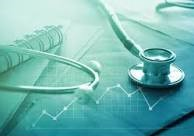

In [30]:
from IPython.display import Image
Image(filename='static/img.jpg')

In [31]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()

In [22]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))

sportingli
veri
troubl


In [23]:
print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))

sportingly
very
troubled


In [32]:
from bs4 import BeautifulSoup
import re

In [33]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [34]:
X['review_clean'] = X['review'].apply(review_to_words)

C:\Users\acer\AppData\Local\Temp\ipykernel_17472\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


In [35]:
X.head()

,condition,review,review_clean
1,ADHD,My son is halfway through his fourth week of I...,son halfway fourth week intuniv became concern...
2,Birth Control,"I used to take another oral contraceptive, whi...",used take another oral contraceptive pill cycl...
3,Birth Control,This is my first time using any form of birth ...,first time using form birth control glad went ...
6,Emergency Contraception,"He pulled out, but he cummed a bit in me. I to...",pulled cummed bit took plan b hour later took ...
9,Birth Control,I had been on the pill for many years. When my...,pill many year doctor changed rx chateal effec...


## Creating features and Target Variable

In [36]:
X_feat=X['review_clean']
y=X['condition']

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X_feat, y,stratify=y,test_size=0.2, random_state=0)

In [38]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Bag of Words

In [39]:
count_vectorizer = CountVectorizer(stop_words='english')

count_train = count_vectorizer.fit_transform(X_train)

count_test = count_vectorizer.transform(X_test)

In [40]:
count_train

<70744x25756 sparse matrix of type '<class 'numpy.int64'>'
	with 2203186 stored elements in Compressed Sparse Row format>

## Machine Learning Model : Naive Bayes

In [46]:
X_train.head()

102169    taking yaz three month adult acne unresponsive...
45451     med work great lot anxiety hard time dealing w...
17191     started taking medication first day pound nice...
75903     recently hip surgery lot pain operation tried ...
122712    trying couple different anti depressant cymbal...
Name: review_clean, dtype: object

In [47]:
X_test.head()

30739     caused headache irritability constipation blur...
156904    third form birth control taken loestrin femcon...
31475     tri cyclen lo five year first contraceptive am...
155618    really liked fact remember take pill implanon ...
157749    drug month put stone happy weight always battl...
Name: review_clean, dtype: object

accuracy:   0.843
Confusion matrix, without normalization


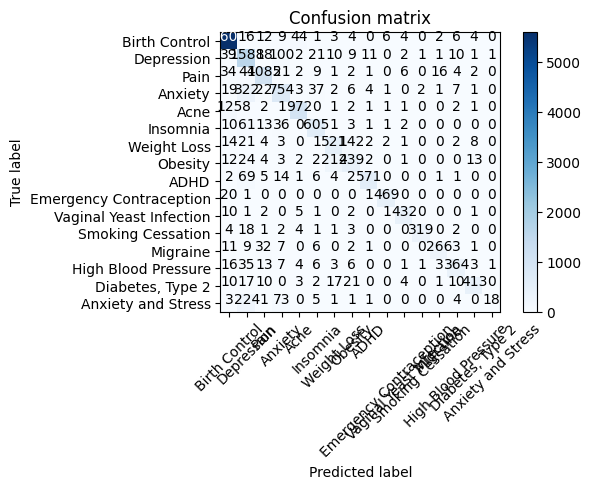

In [42]:
mnb = MultinomialNB()
mnb.fit(count_train, y_train)
pred = mnb.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])

## Machine Learning Model : Passive Aggressive Classifier

accuracy:   0.858
Confusion matrix, without normalization


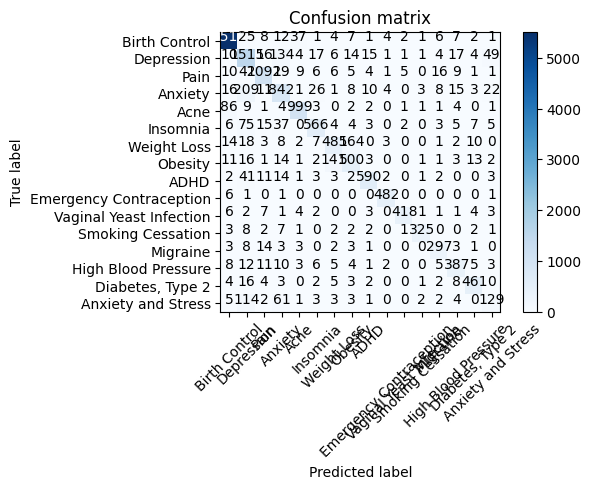

In [43]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(count_train, y_train)
pred = passive.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])

### TFIDF

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train_2 = tfidf_vectorizer.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer.transform(X_test)

## Machine Learning Model : Naive Bayes

accuracy:   0.666
Confusion matrix, without normalization


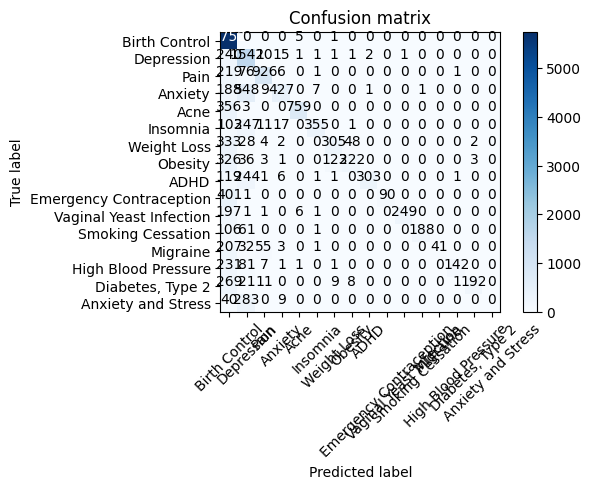

In [49]:
mnb_tf = MultinomialNB()
mnb_tf.fit(tfidf_train_2, y_train)
pred = mnb_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])

## Machine Learning Model TFIDF

accuracy:   0.879
Confusion matrix, without normalization


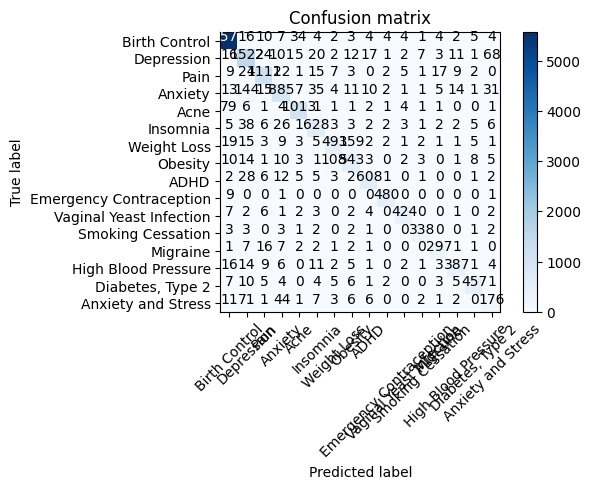

In [50]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train, y_train)
pred = pass_tf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])


## TFIDF: Bigrams

In [51]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,2))
tfidf_train_2 = tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer2.transform(X_test)

accuracy:   0.913
Confusion matrix, without normalization


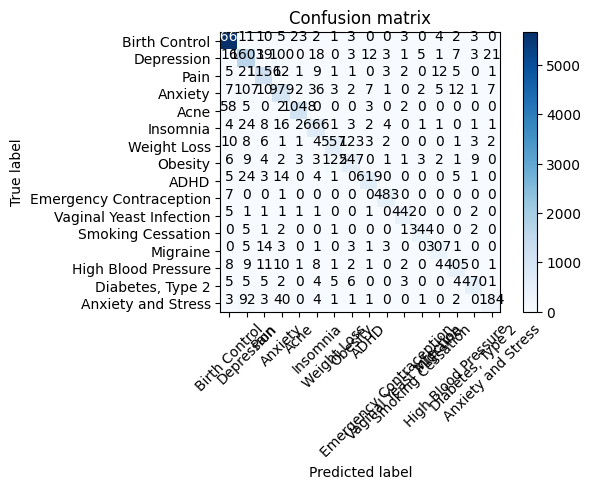

In [52]:
pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_2, y_train)
pred = pass_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])

## TFIDF : Trigrams

accuracy:   0.915
Confusion matrix, without normalization


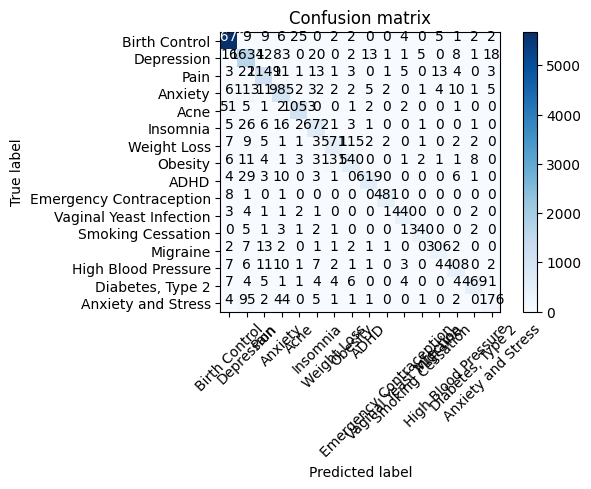

In [54]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3))
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_3, y_train)
pred = pass_tf.predict(tfidf_test_3)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Acne',
    'Insomnia', 'Weight Loss', 'Obesity', 'ADHD',
    'Emergency Contraception', 'Vaginal Yeast Infection',
    'Smoking Cessation', 'Migraine', 'High Blood Pressure',
    'Diabetes, Type 2', 'Anxiety and Stress'])

## Most important Features

In [56]:
def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=10):
    labelid = list(classifier.classes_).index(classlabel)
    feature_names = vectorizer.get_feature_names_out()
    topn = sorted(zip(classifier.coef_[labelid], feature_names))[-n:]

    for coef, feat in topn:
        print (classlabel, feat, coef)



most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Birth Control')

Birth Control maybe excited 3.356976565410313
Birth Control female uneducated 3.384237339471206
Birth Control major clotting 3.43702909563336
Birth Control clean drink 3.489449357895816
Birth Control handle feel 3.9255604972043767
Birth Control continual anger 3.927061731049785
Birth Control stopping desire 4.431148780859854
Birth Control dumbass 4.681356824138255
Birth Control demolished mainly 4.787721519423215
Birth Control dulled lot 5.030413731288537


In [57]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Depression')

Depression past adderall 3.0630402979472646
Depression patch complicated 3.0865051900654237
Depression parent putting 3.363172818820962
Depression phased celexa 3.668265186977074
Depression miss send 3.793883355895177
Depression state healing 4.260514906925628
Depression breakdown self 6.032764779906897
Depression able entire 6.484230476247802
Depression fitbit sleety 7.032534493463278
Depression peer absolutely 11.865110219096044


In [58]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Acne')

Acne hysterectomy bladder 2.8188529349578104
Acne brand gave 2.8771571815890975
Acne anxiety trying 3.033406176225875
Acne rest going 4.0105845552234225
Acne feeling nervous 4.034270095557234
Acne tradeoff functional 5.186456399015592
Acne sure comment 5.196421283331811
Acne phosphosoda pm 5.547473713570368
Acne addition evening 7.544845450742788
Acne affect circle 8.836285101036914


In [59]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'High Blood Pressure')

High Blood Pressure test bringing 2.6071840731686087
High Blood Pressure crashed admitted 3.1630872449101393
High Blood Pressure company sadly 3.527560893086818
High Blood Pressure pristiq cymbalta 3.753113757211661
High Blood Pressure europe dr 3.8686308638455715
High Blood Pressure bloodstream called 4.70500507622795
High Blood Pressure dissipating 4.836726188626374
High Blood Pressure gabapentin residual 4.879731613681946
High Blood Pressure loss granted 5.865376336685351
High Blood Pressure family suggested 8.040880217506226


In [60]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Diabetes, Type 2')

Diabetes, Type 2 awful intermittent 2.435872842908213
Diabetes, Type 2 upset easy 2.454589122435993
Diabetes, Type 2 frequency hope 2.509298795564756
Diabetes, Type 2 say everyday 2.8489649349588237
Diabetes, Type 2 unmanageable proportion 3.1199847956126385
Diabetes, Type 2 eventually depression 3.1883619917491686
Diabetes, Type 2 plausibly 3.291049772116108
Diabetes, Type 2 ankle severe 3.409722731685283
Diabetes, Type 2 future type 5.355131042750643
Diabetes, Type 2 fuse im 5.954885966321444


## Sample Predictions

In [62]:
X_train.tail()

22822     second week feel sad anxious upset stomach cou...
96430     sure medicine endocrinologist prescribed wrong...
15463     knew struggled add college refused go medicati...
104852    pill day gained lb breast tenderness low libid...
150102    nexplanon since october month love insertion s...
Name: review_clean, dtype: object

In [63]:
## Function for Extracting Top drugs

def top_drugs_extractor(condition):
    df_top = df[(df['rating']>=9)&(df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending = [False, False])
    drug_lst = df_top[df_top['condition']==condition]['drugName'].head(3).tolist()
    return drug_lst

In [65]:
def predict_text(lst_text):
    df_test = pd.DataFrame(lst_text, columns = ['test_sent'])
    df_test["test_sent"] = df_test["test_sent"].apply(review_to_words)
    tfidf_bigram = tfidf_vectorizer3.transform(lst_text)
    prediction = pass_tf.predict(tfidf_bigram)
    df_test['prediction']=prediction
    return df_test

In [69]:
from collections import defaultdict

sentences_by_condition = defaultdict(list)
sentences = []
conditions = []

# Iterate over the rows of the DataFrame X
for index, row in X.iterrows():
    condition = row['condition']
    review = row['review']
    conditions.append(condition)
    sentences.append(review)

In [68]:
from collections import defaultdict

# Define a dictionary to store sentences for each condition
sentences_by_condition = defaultdict(list)

# Iterate over the rows of the DataFrame X
for index, row in X.iterrows():
    condition = row['condition']
    review = row['review']
    sentences_by_condition[condition].append(review)

# Define a function to process sentences for each condition
def process_sentences(sentences_dict):
    for condition, sentences in sentences_dict.items():
        if not sentences:
            continue
        print(f"Predictions for {condition}:")
        tfidf_trigram = tfidf_vectorizer3.transform(sentences)
        predictions = pass_tf.predict(tfidf_trigram)
        for text, label in zip(sentences, predictions):
            print("text:", text)
            print("Predicted Condition:", label)
            top_drugs = top_drugs_extractor(label)
            print("Top 3 Suggested Drugs:")
            print(top_drugs[0])
            print(top_drugs[1])
            print(top_drugs[2])
            print()

# Process sentences for each condition
process_sentences(sentences_by_condition)


Predictions for ADHD:
text: My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. 
We have tried many different medications and so far this is the most effective.
Predicted Condition: ADHD
Top 3 Suggested Drugs:
Adderall
Amphetamine / dextroamphetamine
Atomoxetine

text: Hi all, My son who is 12 was diagnosed when he was in 2nd grade. We tried everything before medication. When we tried meds, 

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x0000024912F42ED0>>
Traceback (most recent call last):
  File "C:\Users\acer\AppData\Roaming\Python\Python311\site-packages\ipykernel\ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


KeyboardInterrupt: 

In [71]:
df_testsent = predict_text(sentences)
df_testsent.head()

C:\Users\acer\AppData\Local\Temp\ipykernel_17472\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


,test_sent,prediction
0,son halfway fourth week intuniv became concern...,ADHD
1,used take another oral contraceptive pill cycl...,Birth Control
2,first time using form birth control glad went ...,Birth Control
3,pulled cummed bit took plan b hour later took ...,Emergency Contraception
4,pill many year doctor changed rx chateal effec...,Birth Control


In [73]:
import joblib
joblib.dump(tfidf_vectorizer3, 'tfidfvectorizer.pkl')
joblib.dump(pass_tf, 'passmodel.pkl')

['passmodel.pkl']

In [74]:
vectorizer = joblib.load('tfidfvectorizer.pkl')
model = joblib.load('passmodel.pkl')

test = model.predict(vectorizer.transform(["Hi all, My son who is 12 was diagnosed when he was in 2nd grade. We tried everything before medication. When we tried meds, the first one made him loose weight, fast. The second gave him a nasty tic that thankfully went away as soon as he stopped the med, the third worked for a couple of years and around January of last year we started to have problems so his doctor recommended Daytrana. It has been wonderful for my son! Easy to use, he handles this for himself each day and takes it off when he gets home from school. The patch effects last long enough for him to do his homework. He does have issues with weight gain and sleep but he uses melatonin before bed if he feels like he will not be able to shut down. The shortage is KILLING us!"]))
test[0]

'ADHD'